## Inference with LayoutLMv3ForTokenClassification

In this notebook, we are going to perform inference with `LayoutLMv3ForTokenClassification` on new document images, when no label information is accessible. At the end, we will also make a [Gradio](https://gradio.app/) demo, that turns our inference code into a cool web interface.

## Install libraries

Let's first install the required libraries:
* HuggingFace Transformers + Detectron2 (for the model)
* HuggingFace Datasets (for getting the data)
* PyTesseract (for OCR)

In [1]:
!pip install -q transformers

In [1]:
!pip install pyyaml
!pip install torch torchvision -f https://download.pytorch.org/whl/torch_stable.html

# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!python -m pip install -q 'git+https://github.com/facebookresearch/detectron2.git'
exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

Looking in links: https://download.pytorch.org/whl/torch_stable.html
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 871.0 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 18.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [2]:
!pip install -q datasets

In [3]:
!sudo apt install tesseract-ocr
!pip install -q pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 45 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 10s (505 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debco

## Load dataset

We load the Arabic Books LayoutLM Formatted dataset from the hub, which I uploaded.

In [4]:
from datasets import load_dataset

datasets = load_dataset("alansary/arabic-books-layoutlm-formatted")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/672 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/84 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/84 [00:00<?, ? examples/s]

Let's create a list containing all unique labels, as well as dictionaries mapping integers to their label names and vice versa. This will be useful to convert the model's predictions to actual label names.

In [5]:
labels = datasets['train'].features['ner_tags'].feature.names
print(labels)

['Title', 'Body text']


In [6]:
id2label = {v: k for v, k in enumerate(labels)}
label2id = {k: v for v, k in enumerate(labels)}
label2id

{'Title': 0, 'Body text': 1}

## Inference

Let's test the trained model on the first image of the test set:

In [7]:
example = datasets["test"][1]
print(example.keys())

dict_keys(['id', 'words', 'bboxes', 'ner_tags', 'image'])


We can visualize the document image using PIL:

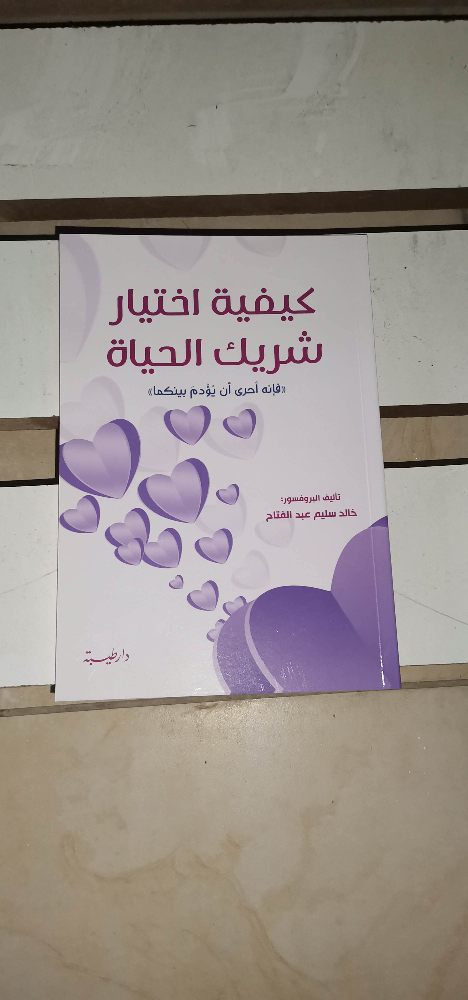

In [10]:
from PIL import Image, ImageDraw, ImageFont

image = example['image']
image = image.convert("RGB")
image

We prepare it for the model using `LayoutLMv3Processor`.

In [12]:
from transformers import LayoutLMv3Processor

processor = LayoutLMv3Processor.from_pretrained("microsoft/layoutlmv3-base")

encoding = processor(image, return_offsets_mapping=True, return_tensors="pt")
offset_mapping = encoding.pop('offset_mapping')
print(encoding.keys())

preprocessor_config.json:   0%|          | 0.00/275 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.14k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

dict_keys(['input_ids', 'attention_mask', 'bbox', 'pixel_values'])


Next, let's move everything to the GPU, if it's available.

In [13]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

for k,v in encoding.items():
  encoding[k] = v.to(device)

In [14]:
from transformers import LayoutLMv3ForTokenClassification

# load the fine-tuned model from the hub
model = LayoutLMv3ForTokenClassification.from_pretrained("alansary/layoutlmv3-finetuned-arabic_books")
model.to(device)

# forward pass
outputs = model(**encoding)
print(outputs.logits.shape)

config.json:   0%|          | 0.00/1.15k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/501M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:1052: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(


torch.Size([1, 24, 2])


Let's create the true predictions as well as the true boxes. With "true", I mean only taking into account tokens that are at the start of a given word. We can use the `offset_mapping` returned by the processor to determine which tokens are a subword.

In [15]:
def unnormalize_box(bbox, width, height):
     return [
         width * (bbox[0] / 1000),
         height * (bbox[1] / 1000),
         width * (bbox[2] / 1000),
         height * (bbox[3] / 1000),
     ]

predictions = outputs.logits.argmax(-1).squeeze().tolist()
token_boxes = encoding.bbox.squeeze().tolist()

width, height = image.size

In [16]:
import numpy as np

is_subword = np.array(offset_mapping.squeeze().tolist())[:,0] != 0

true_predictions = [id2label[pred] for idx, pred in enumerate(predictions) if not is_subword[idx]]
true_boxes = [unnormalize_box(box, width, height) for idx, box in enumerate(token_boxes) if not is_subword[idx]]

In [17]:
print(true_predictions)
print(true_boxes)

['Title', 'Title', 'Title', 'Title', 'Title', 'Title', 'Title', 'Title', 'Title', 'Title', 'Title', 'Title']
[[0.0, 0.0, 0.0, 0.0], [434.30400000000003, 1152.0, 795.6, 1300.0], [844.272, 1148.0, 1261.728, 1288.0], [428.68800000000005, 1352.0, 804.96, 1496.0], [855.504, 1352.0, 1059.552, 1488.0], [1059.552, 1292.0, 1248.624, 1500.0], [593.424, 1544.0, 743.1840000000001, 1588.0], [761.904, 1532.0, 859.248, 1592.0], [877.968, 1528.0, 921.024, 1584.0], [937.872, 1524.0, 1029.6000000000001, 1584.0], [1046.448, 1532.0, 1140.048, 1580.0], [0.0, 0.0, 0.0, 0.0]]


Let's visualize the result!

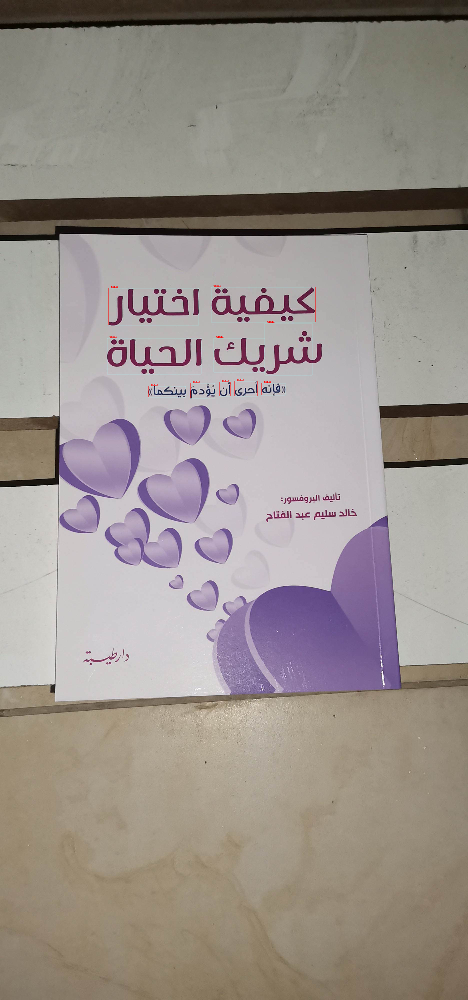

In [22]:
from PIL import ImageDraw

draw = ImageDraw.Draw(image)

font = ImageFont.load_default()

def iob_to_label(label):
    if not label:
      return 'other'
    return label

label2color = {'title':'red', 'body text':'blue'}

for prediction, box in zip(true_predictions, true_boxes):
    predicted_label = iob_to_label(prediction).lower()
    draw.rectangle(box, outline=label2color[predicted_label])
    draw.text((box[0]+10, box[1]-10), text=predicted_label, fill=label2color[predicted_label], font=font)

image

As we can see, results aren't as good as previously. This can be explained by the fact that we're using a different OCR engine than the one that was used during fine-tuning.

Compare this to the ground truth:

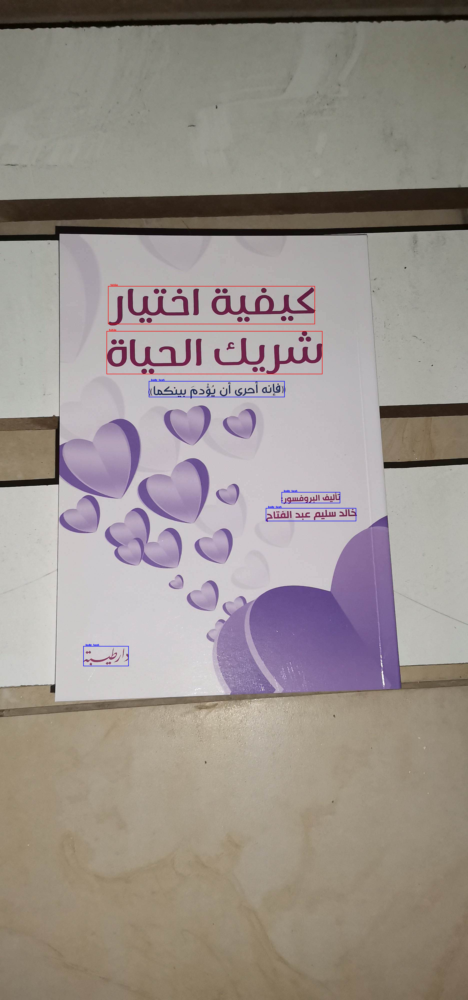

In [23]:
image = example['image']
image = image.convert("RGB")

draw = ImageDraw.Draw(image)

for word, box, label in zip(example['words'], example['bboxes'], example['ner_tags']):
  actual_label = iob_to_label(id2label[label]).lower()
  box = unnormalize_box(box, width, height)
  draw.rectangle(box, outline=label2color[actual_label], width=2)
  draw.text((box[0] + 10, box[1] - 10), actual_label, fill=label2color[actual_label], font=font)

image